<a href="https://colab.research.google.com/github/ismaeilVLSI/Google-Colab-Tutorial/blob/master/car_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!unzip object_detection.zip

Archive:  object_detection.zip
   creating: object_detection/
   creating: object_detection/.github/
   creating: object_detection/.github/ISSUE_TEMPLATE/
  inflating: object_detection/.github/ISSUE_TEMPLATE/bug_report.md  
   creating: object_detection/.github/workflows/
  inflating: object_detection/.github/workflows/stale.yml  
 extracting: object_detection/.gitignore  
   creating: object_detection/.ipynb_checkpoints/
  inflating: object_detection/.ipynb_checkpoints/Tensorflow_2_Object_Detection_Train_model-checkpoint.ipynb  
  inflating: object_detection/create_coco_tf_record.py  
   creating: object_detection/doc/
  inflating: object_detection/doc/image_gallery.PNG  
  inflating: object_detection/doc/label_image.png  
  inflating: object_detection/doc/monitor_training.png  
  inflating: object_detection/doc/output.png  
  inflating: object_detection/doc/training_model.png  
  inflating: object_detection/doc/tutorial_output.png  
  inflating: object_detection/generate_tfrecord.py 

In [5]:
cd object_detection/ 

/content/object_detection


In [6]:
!ls

create_coco_tf_record.py  README.md
doc			  resize_images.py
generate_tfrecord.py	  Tensorflow_2_Object_Detection_Train_model.ipynb
images			  training
LICENSE			  xml_to_csv.py


In [7]:
!pip install -U --pre tensorflow=="2.2.0"

     |████████████████████████████████| 516.2MB 33kB/s 
     |████████████████████████████████| 3.0MB 50.4MB/s 
     |████████████████████████████████| 460kB 49.6MB/s 
  Found existing installation: tensorboard 2.3.0
    Uninstalling tensorboard-2.3.0:
      Successfully uninstalled tensorboard-2.3.0
  Found existing installation: tensorflow-estimator 2.3.0
    Uninstalling tensorflow-estimator-2.3.0:
      Successfully uninstalled tensorflow-estimator-2.3.0
  Found existing installation: tensorflow 2.3.0
    Uninstalling tensorflow-2.3.0:
      Successfully uninstalled tensorflow-2.3.0


In [8]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2282, done.
remote: Counting objects: 100% (2282/2282), done.
remote: Compressing objects: 100% (1976/1976), done.
remote: Total 2282 (delta 559), reused 971 (delta 280), pack-reused 0
Receiving objects: 100% (2282/2282), 30.55 MiB | 26.27 MiB/s, done.
Resolving deltas: 100% (559/559), done.


In [10]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/object_detection/models/research
  Created wheel for object-detection: filename=object_detection-0.1-cp36-none-any.whl size=1597036 sha256=1ae5c590cc0c8b271121d67a1ec30990ad0fd313cf2e996d63d28f2fbfe2880e
  Stored in directory: /tmp/pip-ephem-wheel-cache-bcie2xx0/wheels/cd/38/29/a5471282c15ca3a4f95b2f77066e3a7154685b6a428f65cd5d
Successfully built object-detection
  Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1


In [11]:
#run model builder test
!python models/research/object_detection/builders/model_builder_tf2_test.py

2020-10-31 08:50:50.354114: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Running tests under Python 3.6.9: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model
2020-10-31 08:50:52.646442: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-10-31 08:50:52.705146: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-10-31 08:50:52.705789: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.73GiB deviceMemoryBandwidth: 298.08GiB/s
2020-10-31 08:50:52.705847: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully o

In [12]:
!python generate_tfrecord.py --csv_input=images/train_labels.csv --image_dir=images/train --output_path=train.record
!python generate_tfrecord.py --csv_input=images/test_labels.csv --image_dir=images/test --output_path=test.record

2020-10-31 08:52:21.480116: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Successfully created the TFRecords: /content/object_detection/train.record
2020-10-31 08:52:23.989254: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Successfully created the TFRecords: /content/object_detection/test.record


In [13]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
!tar -xf efficientdet_d0_coco17_tpu-32.tar.gz
fine_tune_checkpoint = 'efficientdet_d0_coco17_tpu-32/checkpoint/ckpt-0'

--2020-10-31 08:52:37--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.197.128, 2607:f8b0:400e:c09::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.197.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘efficientdet_d0_coco17_tpu-32.tar.gz’

efficientdet_d0_coc 100%[===================>]  29.31M  49.2MB/s    in 0.6s    

2020-10-31 08:52:38 (49.2 MB/s) - ‘efficientdet_d0_coco17_tpu-32.tar.gz’ saved [30736482/30736482]



In [14]:
!python models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path=training/ssd_efficientdet_d0_512x512_coco17_tpu-8.config --model_dir=training --alsologtostderr

2020-10-31 08:52:59.147622: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-10-31 08:53:01.246622: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-10-31 08:53:01.283091: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-10-31 08:53:01.283746: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.73GiB deviceMemoryBandwidth: 298.08GiB/s
2020-10-31 08:53:01.283794: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-10-31 08:53:01.290236: I tensorflow/stream_executor/platform/default

In [16]:
%load_ext tensorboard
%tensorboard --logdir 'training/train'

<IPython.core.display.Javascript object>

In [19]:
with open('/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/utils/tf_utils.py') as f:
    tf_utils = f.read()

with open('/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/utils/tf_utils.py', 'w') as f:
  # Set labelmap path
  throw_statement = "raise TypeError('Expected Operation, Variable, or Tensor, got ' + str(x))"
  tf_utils = tf_utils.replace(throw_statement, "if not isinstance(x, str):" + throw_statement)
  f.write(tf_utils)

In [24]:
model_dir = 'training/'
pipeline_config_path = 'training/ssd_efficientdet_d0_512x512_coco17_tpu-8.config'

In [25]:
output_directory = 'inference_graph'

!python models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {model_dir} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_config_path}

2020-10-31 11:53:30.921726: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-10-31 11:53:32.815102: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-10-31 11:53:32.860405: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-10-31 11:53:32.861063: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.73GiB deviceMemoryBandwidth: 298.08GiB/s
2020-10-31 11:53:32.861104: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-10-31 11:53:32.864690: I tensorflow/stream_executor/platform/default

In [26]:
from google.colab import files
files.download(f'{output_directory}/saved_model/saved_model.pb') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Test trained model on test images

In [27]:
import io
import os
import scipy.misc
import numpy as np
import six
import time
import glob
from IPython.display import display

from six import BytesIO

import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

In [28]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path (this can be local or on colossus)

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [35]:
labelmap_path = 'training/labelmap.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(labelmap_path, use_display_name=True)
print(category_index)

{1: {'id': 1, 'name': 'mercedes_logo'}, 2: {'id': 2, 'name': 'channel_logo'}}


In [32]:
tf.keras.backend.clear_session()
model = tf.saved_model.load(f'{output_directory}/saved_model')

In [33]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

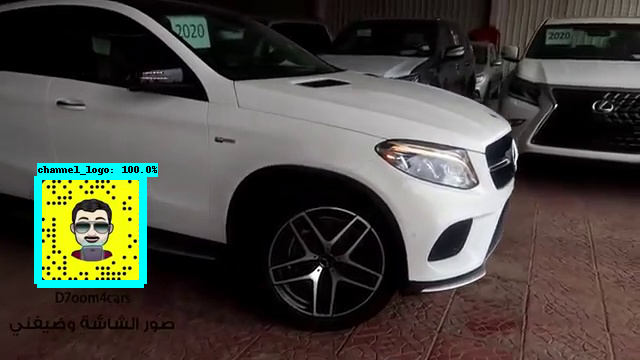

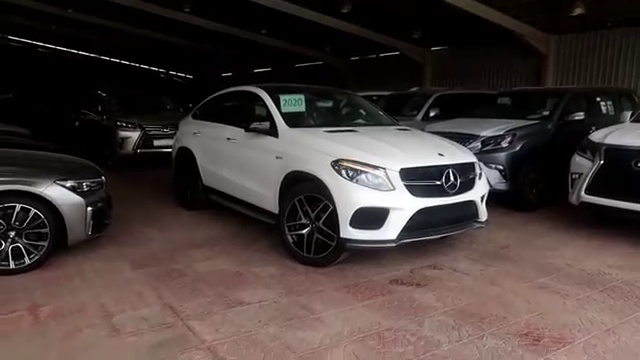

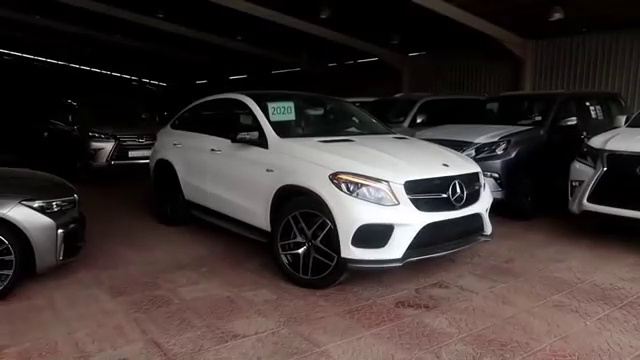

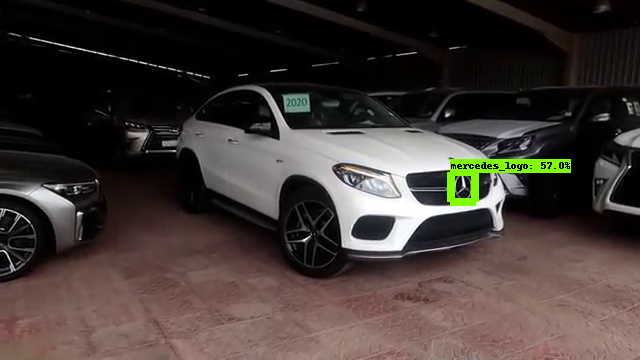

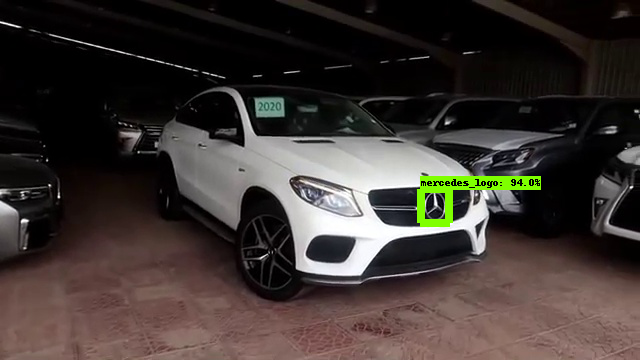

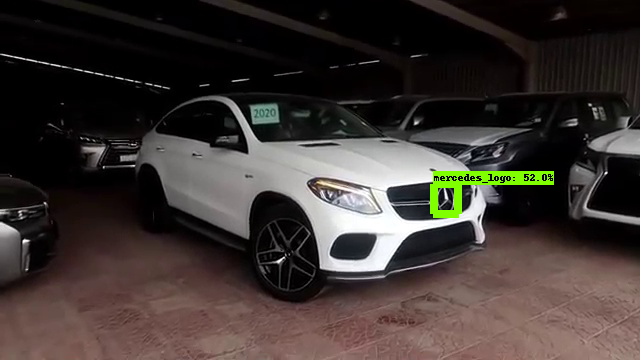

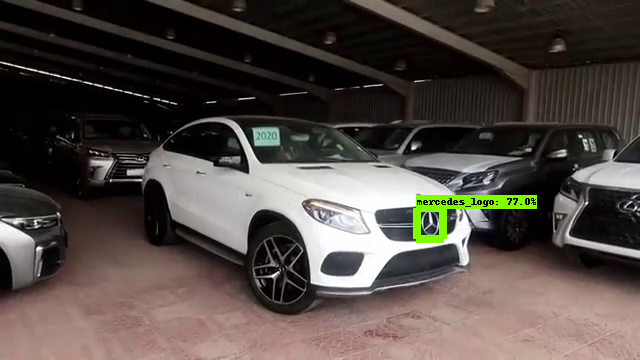

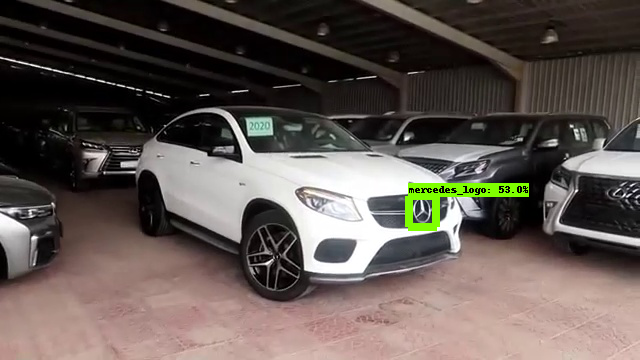

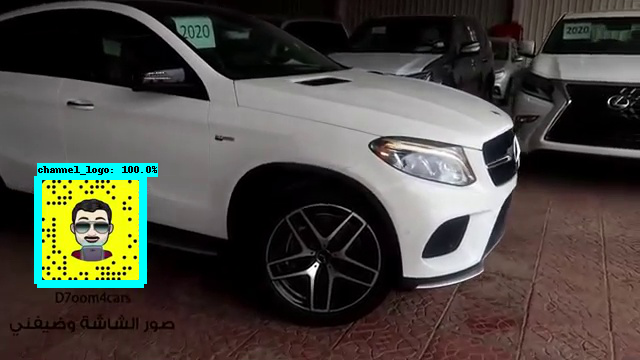

In [36]:
for image_path in glob.glob('images/test/*.jpg'):
  image_np = load_image_into_numpy_array(image_path)
  output_dict = run_inference_for_single_image(model, image_np)
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)
  display(Image.fromarray(image_np))